In [1]:
from sklearn.linear_model import LinearRegression
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from ttvfast import models, ttvfast

Tstart=1517.921417
Tend=5800

def calc_ttvs_full(p):
    mp1, sqecosw1, sqesinw1, wpn1, P1 = p[3], p[4], p[5], p[6], p[7]
    mp2, sqecosw2, sqesinw2, wpn2, P2 = p[10], p[11], p[12], p[13], p[14]
    e1, e2 = sqecosw1**2 + sqesinw1**2, sqecosw2**2 + sqesinw2**2
    w1, w2 = np.arctan2(sqesinw1, sqecosw1), np.arctan2(sqesinw2, sqecosw2)
    n1, n2 = (wpn1 - w1) % (2 * np.pi), (wpn2 - w2) % (2 * np.pi)

    gravity, stellar_mass = 0.000295994511, 0.73
    planet1 = models.Planet(mp1 / 332946., P1, e1, 90, 180, np.rad2deg(w1), np.rad2deg(n1))
    planet2 = models.Planet(mp2 / 332946., P2, e2, 90, 180, np.rad2deg(w2), np.rad2deg(n2))
    results = ttvfast([planet1, planet2], stellar_mass, Tstart, 0.1, Tend)

    pl, model_epoch, model_tt, model_vsky = map(np.array, [results['positions'][0], results['positions'][1], results['positions'][2], results['positions'][4]])
    pl1_index, pl2_index = np.where((pl == 0) & (model_vsky > 0))[0], np.where((pl == 1) & (model_vsky > 0))[0]
    model_epoch1, model_tt1 = model_epoch[pl1_index], model_tt[pl1_index]
    model_epoch2, model_tt2 = model_epoch[pl2_index], model_tt[pl2_index]

    def linear_regression(X, y):
        regressor = LinearRegression().fit(X.reshape(-1, 1), y)
        residuals = y - regressor.predict(X.reshape(-1, 1))
        return residuals, regressor.coef_

    residuals_tt1, Pb = linear_regression(model_epoch1, model_tt1)
    residuals_tt2, Pc = linear_regression(model_epoch2, model_tt2)
    return model_epoch1, model_epoch2, model_tt1, model_tt2, residuals_tt1, residuals_tt2, Pb, Pc

p=[ 1.46840934e+01,  4.17530770e-01,  3.69333585e-02,10.2,  3.06358386e-02,
  5.47890505e-01 , 1.77032863e+00,  6.39814142e+00 , 4.13191861e-01,
  3.39249786e-02,9.7, -3.27206806e-02,  2.83848810e-01,  2.64006150e+00,
  1.88803002e+01,  5.13541233e-01,  1.66618171e-01, -1.49245579e+01,
 -1.37407142e+01, -1.57576637e+01, -1.39691274e+01,  7.64752840e-01,
  1.27183317e+00,  1.90660999e+00,  1.13216500e+00,  5.28340332e-04,
  8.91321158e-04,  5.10434401e-04,  4.95868483e-04]

data_b = pd.read_csv("../ttv/TTV_TOI-560b.csv", header=None)
epoch_b = data_b.iloc[:,0]
ob_b_1 = list(data_b.iloc[:,1])
ob_err_b_1 = list(data_b.iloc[:,2])

data_c = pd.read_csv("../ttv/TTV_TOI-560c.csv", header=None)
epoch_c = data_c.iloc[:,0]
ob_c_1 = list(data_c.iloc[:,1])
ob_err_c_1 = list(data_c.iloc[:,2])

## check!!
ob_b=calc_ttvs_full(p)[2]
ob_c=calc_ttvs_full(p)[3]
ttv_b=calc_ttvs_full(p)[4]
ttv_c=calc_ttvs_full(p)[5]

#ob_b = calc_ttvs_full(p)[2][::2]
#ob_c = calc_ttvs_full(p)[3][::2]
#ttv_b = calc_ttvs_full(p)[4][::2]
#ttv_c = calc_ttvs_full(p)[5][::2]

## check!!
std_dev_b = 0.0005
std_dev_c = 0.0015
ob_b = np.array([np.random.normal(loc=value, scale=std_dev_b) for value in ob_b])
ob_c = np.array([np.random.normal(loc=value, scale=std_dev_c) for value in ob_c])

lower_bound = 0
upper_bound = 120

mask_b = (ob_b % 365 >= lower_bound) & (ob_b % 365 <= upper_bound) & (ob_b>3900) & (ob_b<5400)
mask_c = (ob_c % 365 >= lower_bound) & (ob_c % 365 <= upper_bound) & (ob_c>3900) & (ob_c<5400)

# Apply the masks to all corresponding arrays
ob_b = ob_b[mask_b]
ttv_b = ttv_b[mask_b]

ob_c = ob_c[mask_c]
ttv_c = ttv_c[mask_c]


## check!!
#ob_err_b = [0.001855] * len(ob_b)
#ob_err_b = [0.00102] * len(ob_b)
## bestな観測
ob_err_b=[0.00056]*len(ob_b)
#ob_err_c = [0.002652] * len(ob_c)
ob_err_c = [0.001458] * len(ob_c)

ob_b = np.concatenate((ob_b_1, ob_b))
ob_err_b = np.concatenate((ob_err_b_1, ob_err_b))
ob_c = np.concatenate((ob_c_1, ob_c))
ob_err_c = np.concatenate((ob_err_c_1, ob_err_c))

Pb=calc_ttvs_full(p)[6]
Pc=calc_ttvs_full(p)[7]

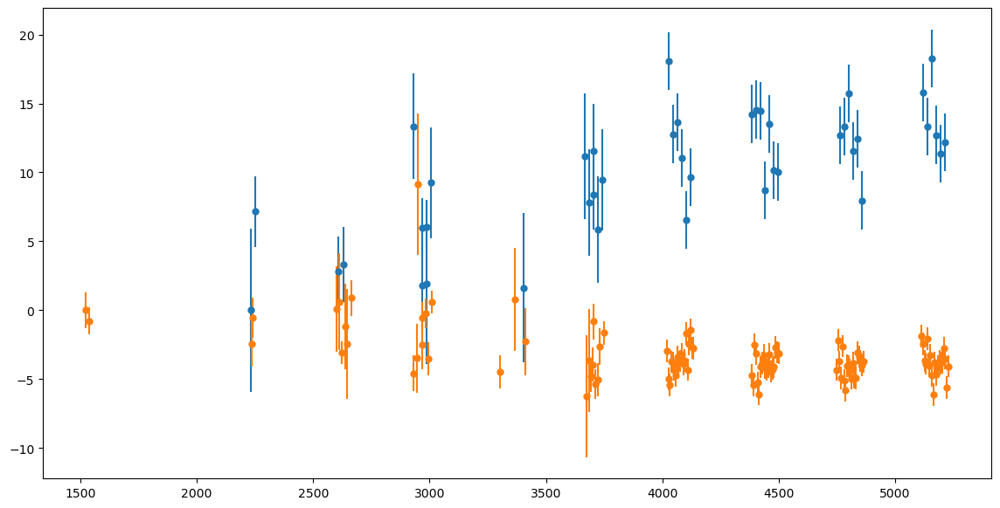

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from ttvfast import models
import ttvfast
from matplotlib.ticker import AutoMinorLocator
import emcee
import corner
from multiprocessing import Pool
from scipy.optimize import minimize
import os
os.environ['OMP_NUM_THREADS']='1'
os.nice(19)

Tc0b = ob_b[0]
Tc0c = ob_c[0]

#Tstartから最初の観測までは何周期たっているか（その切り捨て）
epc0 = np.floor((Tc0c-Tstart)/Pc)
epb0 = np.floor((Tc0b-Tstart)/Pb)

#Tstartから任意の観測までは何周期たっているか（その切り捨てすなわちepoch）
epc = np.floor((ob_c-Tstart)/Pc)
epb = np.floor((ob_b-Tstart)/Pb)

#ttvの量
ttvc = ob_c - (Tc0c +(epc-epc0)*Pc)
ttvb = ob_b - (Tc0b +(epb-epb0)*Pb)
plt.figure(figsize=(14, 7))
plt.errorbar(ob_c, ttvc*1440, yerr=ob_err_c*1440, fmt='o',ms=5)
plt.errorbar(ob_b, ttvb*1440, yerr=ob_err_b*1440, fmt='o',ms=5)

#pを渡してttvfastから得られる配列を渡す関数を定義
def calc_ttvs_2pl(p):

    mp1 = p[0]
    sqecosw1 = p[1]
    sqesinw1 = p[2]
    wpM1 = p[3] # w + M, radians,0~2*pi
    P1 = p[4]

    mp2 = p[5]
    sqecosw2 = p[6]
    sqesinw2 = p[7]
    wpM2 = p[8] # w + M, radians,0~2*pi
    P2 = p[9]
    
    #軌道要素に戻す
    e1 = sqecosw1**2 + sqesinw1**2
    e2 = sqecosw2**2 + sqesinw2**2
    w1 = np.arctan2(sqesinw1, sqecosw1) #radian,-pi~pi
    w2 = np.arctan2(sqesinw2, sqecosw2) #radian,-pi~pi
    M1 = wpM1 - w1 #radian, 幅広い値を取るが、MCMCで求める量ではないし、ttvfastには影響を与えないからこれでいい
    M2 = wpM2 - w2 #radian,

    if M1<0:
        M1+=2*np.pi
    if M1<0:
        M1+=2*np.pi
    if M2<0:
        M2+=2*np.pi
    if M2<0:
        M2+=2*np.pi
    
    gravity = 0.000295994511                        # AU^3/day^2/M_sun
    stellar_mass = 0.73                    # M_sun

    #多分これでいい
    planet1 = models.Planet(
        mass=mp1 / 332946.,                         # M_sun
        period=P1,              # days
        eccentricity=e1,
        inclination=90,         # degrees
        longnode=180,           # degrees
        argument=np.rad2deg(w1),            # degreesに変換！
        mean_anomaly= np.rad2deg(M1),       # degreesに変換！
    )

    planet2 = models.Planet(
        mass=mp2 / 332946.,
        period=P2,
        eccentricity=e2,
        inclination=90,
        longnode=180,
        argument=np.rad2deg(w2),
        mean_anomaly= np.rad2deg(M2),
    )
    

    planets = [planet1, planet2]
    dt = 0.3

    return ttvfast.ttvfast(planets, stellar_mass, Tstart, dt, Tend)

In [3]:
def log_likelihood(p):
    mp1 = p[0]
    sqecosw1 = p[1]
    sqesinw1 = p[2]
    wpM1 = p[3] # radian
    P1 = p[4]

    mp2 = p[5]
    sqecosw2 = p[6]
    sqesinw2 = p[7]
    wpM2 = p[8] # radian
    P2 = p[9]

    #あり得ない値を排除        
    if sqecosw1 <= -1. or sqecosw1 >= 1.0 or sqesinw1 <= -1. or sqesinw1 >= 1.0:
        return -np.inf
    
    if sqecosw2 <= -1. or sqecosw2 >= 1.0 or sqesinw2 <= -1. or sqesinw2 >= 1.0:
        return -np.inf
    
    e1 = sqecosw1**2 + sqesinw1**2
    e2 = sqecosw2**2 + sqesinw2**2

    if e1 <=1e-10 or e1 >= 0.9:
        return -np.inf

    if e2 <=1e-10 or e2 >= 0.9:
        return -np.inf
        
    if P1 < 0 or P2 < 0:
        return -np.inf
    
    if mp1 < 0:
        return -np.inf

    if mp2 < 0:
        return -np.inf

    if wpM1 < 0 or wpM1 > 2*np.pi: #radianのとりうる範囲は0から2pi
        return -np.inf
    
    if wpM2 < 0 or wpM2 > 2*np.pi:
        return -np.inf    

   
    try:
        results = calc_ttvs_2pl(p)
    except:
        return -np.inf

    #配列データの整理
    pl = np.array(results['positions'][0])
    model_epoch = np.array(results['positions'][1])
    model_tt = np.array(results['positions'][2])
    model_vsky = np.array(results['positions'][4])

    #？？？model_vskyの意味
    pl1_index = np.where((pl==0) & (model_vsky>0))[0]
    pl2_index = np.where((pl==1) & (model_vsky>0))[0]

    model_epoch1 = model_epoch[pl1_index]
    model_epoch2 = model_epoch[pl2_index]
    model_tt1 = model_tt[pl1_index]
    model_tt2 = model_tt[pl2_index]

    #likelihoodの計算
    log_like=0   

    for i in range(len(epb)):
        Tc_model = model_tt1[model_epoch1==(int(epb[i]))]
        if(len(Tc_model)==0):
            return -np.inf
        
        if abs(ob_b[i] - Tc_model[0]) > 1: #[day]
            #print("bでエラー")
            return -np.inf
              
        log_like += (-0.5*(ob_b[i] - Tc_model[0])**2 / (ob_err_b[i]**2))-0.5*np.log(2*np.pi*(ob_err_b[i]**2))



    ## planet2
    for i in range(len(epc)):
        Tc_model = model_tt2[model_epoch2==(int(epc[i]))]
        if(len(Tc_model)==0):
            return -np.inf
        

        if abs(ob_c[i] - Tc_model[0]) > 1:
            #print("cでエラー")
            return -np.inf
                         
        log_like += (-0.5*(ob_c[i] - Tc_model[0])**2 / (ob_err_c[i]**2))-0.5*np.log(2*np.pi*(ob_err_c[i]**2))
    return log_like    

def log_prior(P):
    mp1=P[0]
    mp2=P[5]
    lp=0

    return lp

def log_posterior(p):
    lp = log_prior(p)
    if not np.isfinite(lp):
        return -np.inf
    return lp + log_likelihood(p)

def neg_log_posterior(p):
    return -1* log_posterior(p)

In [4]:
def mcmc_first():
    mp1 = 0.1
    e1 = 0.001
    w1 = np.radians(-76)
    sqecosw1 = np.sqrt(e1)*np.cos(w1)
    sqesinw1 = np.sqrt(e1)*np.sin(w1)
    wpM1 = (Tstart-Tc0b)/Pb*2*np.pi + np.pi/2
    wpM1 =  np.float64((wpM1/(2*np.pi) - np.floor(wpM1/(2*np.pi)))*2*np.pi) #0から2piに
    P1 =  6.398050683568169

    mp2 = 0.1
    e2 = 0.001
    w2 = np.radians(-41.6)
    sqecosw2 = np.sqrt(e2)*np.cos(w2)
    sqesinw2 = np.sqrt(e2)*np.sin(w2)
    wpM2 = (Tstart-Tc0c)/Pc*2*np.pi + np.pi/2
    wpM2 = np.float64((wpM2/(2*np.pi) - np.floor(wpM2/(2*np.pi)))*2*np.pi) #0から2piに
    P2 = 18.87925686582526
    
    p0 = [mp1, sqecosw1, sqesinw1, wpM1, P1, mp2, sqecosw2, sqesinw2, wpM2, P2]

    print(log_posterior(p0))
    print(p0)
    
    res = minimize(neg_log_posterior, p0, method='Nelder-Mead')
    print(log_posterior(res.x))    
    print(res.x)
    mp1, sqecosw1, sqesinw1, wpM1, P1, mp2, sqecosw2, sqesinw2, wpM2, P2=res.x[0:10]
    e1=sqecosw1**2+sqesinw1**2
    e2=sqecosw2**2+sqesinw2**2
    
    #walkerを1000にしてcutする
    
    ndim, nwalkers = len(p0), 1000

    mpmin1, mpmax1= mp1-0.1, mp1+0.1
    mpmin2, mpmax2= mp2-0.1, mp2+0.1

    #各walkerの初期位置をずらす
    pos = []
    for i in range(nwalkers):

        e1_tmp = e1 + 1e-7*np.random.rand(1)
        e2_tmp = e2 + 1e-7*np.random.rand(1)
        w1_tmp = np.pi*(2*np.random.rand(1)-1)
        w2_tmp = np.pi*(2*np.random.rand(1)-1)
        sqecosw1_tmp = np.sqrt(e1_tmp)*np.cos(w1_tmp)
        sqesinw1_tmp = np.sqrt(e1_tmp)*np.sin(w1_tmp)
        sqecosw2_tmp = np.sqrt(e2_tmp)*np.cos(w2_tmp)
        sqesinw2_tmp = np.sqrt(e2_tmp)*np.sin(w2_tmp)

        wpM1_tmp = (Tstart-Tc0b)/Pb*2*np.pi + np.pi/2. + 1e-5*np.random.randn(1)
        wpM1_tmp = (wpM1_tmp/(2*np.pi) - np.floor(wpM1_tmp/(2*np.pi)))*2*np.pi
        wpM2_tmp = (Tstart-Tc0c)/Pc*2*np.pi + np.pi/2. + 1e-5*np.random.randn(1)
        wpM2_tmp = (wpM2_tmp/(2*np.pi) - np.floor(wpM2_tmp/(2*np.pi)))*2*np.pi


        pos_tmp = np.empty(0)

        pos_tmp = np.append(pos_tmp, mpmin1 + (mpmax1-mpmin1)*np.random.rand(1)) # mp1
        pos_tmp = np.append(pos_tmp, np.array((sqecosw1_tmp,sqesinw1_tmp,wpM1_tmp)))  
        pos_tmp = np.append(pos_tmp, P1 + 1e-8*np.random.randn(1)) # P1

        pos_tmp = np.append(pos_tmp, mpmin2 + (mpmax2-mpmin2)*np.random.rand(1)) # mp2
        pos_tmp = np.append(pos_tmp, np.array((sqecosw2_tmp,sqesinw2_tmp,wpM2_tmp)))  
        pos_tmp = np.append(pos_tmp, P2 + 1e-8*np.random.randn(1)) # P2

        pos.append(pos_tmp)

    #stepの数を変更
    nsteps = 100000
    ndim = len(p0)

    #filename = 'mcmc_ttvfit.hd5'
    #backend = emcee.backends.HDFBackend(filename)
    #backend.reset(nwalkers, ndim)

    with Pool(48) as pool:
        sampler = emcee.EnsembleSampler(nwalkers, ndim, log_posterior,moves=emcee.moves.DEMove(),pool=pool)
        sampler.run_mcmc(pos, nsteps, progress=True)

    # sampler = emcee.EnsembleSampler(nwalkers, ndim, log_like_2pl, moves=emcee.moves.DEMove())
    # sampler.run_mcmc(pos, nsteps, progress=True)

    #ここの値も変更
    discard=50000
    thin=50
    samples = sampler.get_chain(discard=discard, thin=thin, flat=True)

    for i in range(10):
        mcmc = np.percentile(samples[:, i], [16, 50, 84])
        q = np.diff(mcmc)
        print(mcmc[1], "+",q[1], "-", q[0])

    fig = corner.corner(samples, labels=["mb", "sqecosw1", "sqesinw1", "wpM1", "Pb", "mc", "sqecosw2", "sqesinw2", "wpM2", "Pc"],quantiles=[0.16,0.5,0.84],show_titles=True, title_fmt='.3f', label_kwargs={'fontsize':20})
    #plt.savefig("ttv_corner_try1_best_お試し.png", format="png", dpi=300)
    plt.show()

    log_prob = sampler.get_log_prob()
    print(log_prob)
    plt.figure(figsize=(8,4))
    plt.rcParams['font.size']=12
    for i in range(nwalkers):
        plt.plot(log_prob[:,i],alpha=0.1)
    plt.xlabel('Number of steps', fontsize=20)
    plt.ylabel('Log probability', fontsize=20)
    plt.show()

    log_prob = sampler.get_log_prob(flat=True, discard=discard, thin=thin)
    samples = sampler.get_chain(discard=discard, thin=thin, flat=True)
    argmax = np.argmax(log_prob)
    print(log_prob[argmax])
    print(samples[argmax,:])


    ntop=200
    
    log_prob = sampler.get_log_prob()
    samples = sampler.get_chain()
    argsort = np.argsort(log_prob[-1])
    index = argsort[-(ntop+1):-1]
    pos = samples[-1,index,:]
    
    
    return pos

In [5]:
def mcmc_second(pos):
    #stepの数を変更
    nwalkers=200
    nsteps = 100000
    ndim=10

    #配列のappendを理解
    #ここを解決

    #filename = 'mcmc_ttvfit_pl3_2.hd5'
    #backend = emcee.backends.HDFBackend(filename)
    #backend.reset(nwalkers, ndim)

    #ここ
    with Pool(48) as pool:
        sampler = emcee.EnsembleSampler(nwalkers, ndim, log_posterior,moves=emcee.moves.DEMove(),pool=pool)
        sampler.run_mcmc(pos, nsteps,progress=True)


    #ここの値も変更
    discard=50000
    thin=100
    samples = sampler.get_chain(discard=discard, thin=thin, flat=True)

    for i in range(10):
        mcmc = np.percentile(samples[:, i], [16, 50, 84])
        q = np.diff(mcmc)
        print(mcmc[1], "+",q[1], "-", q[0])

    fig = corner.corner(samples, labels=["mb", "sqecosw1", "sqesinw1", "wpM1", "Pb", "mc", "sqecosw2", "sqesinw2", "wpM2", "Pc"],quantiles=[0.16,0.5,0.84],show_titles=True, title_fmt='.3f', label_kwargs={'fontsize':20})
    #plt.savefig("ttv_corner_try1_best_お試し.png", format="png", dpi=300)
    plt.show()

    log_prob = sampler.get_log_prob()
    print(log_prob)
    plt.figure(figsize=(8,4))
    plt.rcParams['font.size']=12
    for i in range(nwalkers):
        plt.plot(log_prob[:,i],alpha=0.1)
    plt.xlabel('Number of steps', fontsize=20)
    plt.ylabel('Log probability', fontsize=20)
    plt.show()

    log_prob = sampler.get_log_prob(flat=True, discard=discard, thin=thin)
    samples = sampler.get_chain(discard=discard, thin=thin, flat=True)
    argmax = np.argmax(log_prob)
    print(log_prob[argmax])
    print(samples[argmax,:])

    log_prob = sampler.get_log_prob()
    samples = sampler.get_chain()
    argsort = np.argsort(log_prob[-1])
    pos = samples[-1,:,:]
    
    return pos

def mcmc_second_last(pos):
    #stepの数を変更
    nwalkers=200
    nsteps = 100000
    ndim=10

    #配列のappendを理解
    #ここを解決

    #filename = 'mcmc_ttvfit_pl3_2.hd5'
    #backend = emcee.backends.HDFBackend(filename)
    #backend.reset(nwalkers, ndim)

    #ここ
    with Pool(48) as pool:
        sampler = emcee.EnsembleSampler(nwalkers, ndim, log_posterior,moves=emcee.moves.DEMove(),pool=pool)
        sampler.run_mcmc(pos, nsteps,progress=True)


    #ここの値も変更
    discard=50000
    thin=100
    samples = sampler.get_chain(discard=discard, thin=thin, flat=True)

    for i in range(10):
        mcmc = np.percentile(samples[:, i], [16, 50, 84])
        q = np.diff(mcmc)
        print(mcmc[1], "+",q[1], "-", q[0])

    fig = corner.corner(samples, labels=["mb", "sqecosw1", "sqesinw1", "wpM1", "Pb", "mc", "sqecosw2", "sqesinw2", "wpM2", "Pc"],quantiles=[0.16,0.5,0.84],show_titles=True, title_fmt='.3f', label_kwargs={'fontsize':20})
    #plt.savefig("ttv_corner_try1_best_お試し.png", format="png", dpi=300)
    plt.show()

    log_prob = sampler.get_log_prob()
    print(log_prob)
    plt.figure(figsize=(8,4))
    plt.rcParams['font.size']=12
    for i in range(nwalkers):
        plt.plot(log_prob[:,i],alpha=0.1)
    plt.xlabel('Number of steps', fontsize=20)
    plt.ylabel('Log probability', fontsize=20)
    plt.show()

    log_prob = sampler.get_log_prob(flat=True, discard=discard, thin=thin)
    samples = sampler.get_chain(discard=discard, thin=thin, flat=True)
    argmax = np.argmax(log_prob)
    print(log_prob[argmax])
    print(samples[argmax,:])

    ntop=100
    
    log_prob = sampler.get_log_prob()
    samples = sampler.get_chain()
    argsort = np.argsort(log_prob[-1])
    index = argsort[-(ntop+1):-1]
    pos = samples[-1,index,:]
    
    return pos

def mcmc_third(pos):
    #stepの数を変更
    nwalkers=100
    nsteps = 100000
    ndim=10

    #配列のappendを理解
    #ここを解決

    #filename = 'mcmc_ttvfit_pl3_2.hd5'
    #backend = emcee.backends.HDFBackend(filename)
    #backend.reset(nwalkers, ndim)

    #ここ
    with Pool(48) as pool:
        sampler = emcee.EnsembleSampler(nwalkers, ndim, log_posterior,pool=pool)
        sampler.run_mcmc(pos, nsteps,progress=True)


    #ここの値も変更
    discard=50000
    thin=100
    samples = sampler.get_chain(discard=discard, thin=thin, flat=True)

    for i in range(10):
        mcmc = np.percentile(samples[:, i], [16, 50, 84])
        q = np.diff(mcmc)
        print(mcmc[1], "+",q[1], "-", q[0])

    fig = corner.corner(samples, labels=["mb", "sqecosw1", "sqesinw1", "wpM1", "Pb", "mc", "sqecosw2", "sqesinw2", "wpM2", "Pc"],quantiles=[0.16,0.5,0.84],show_titles=True, title_fmt='.3f', label_kwargs={'fontsize':20})
    #plt.savefig("ttv_corner_try1_best_お試し.png", format="png", dpi=300)
    plt.show()

    log_prob = sampler.get_log_prob()
    print(log_prob)
    plt.figure(figsize=(8,4))
    plt.rcParams['font.size']=12
    for i in range(nwalkers):
        plt.plot(log_prob[:,i],alpha=0.1)
    plt.xlabel('Number of steps', fontsize=20)
    plt.ylabel('Log probability', fontsize=20)
    plt.show()

    log_prob = sampler.get_log_prob(flat=True, discard=discard, thin=thin)
    samples = sampler.get_chain(discard=discard, thin=thin, flat=True)
    argmax = np.argmax(log_prob)
    print(log_prob[argmax])
    print(samples[argmax,:])

    log_prob = sampler.get_log_prob()
    samples = sampler.get_chain()
    argsort = np.argsort(log_prob[-1])
    pos = samples[-1,:,:]
    
    return pos

In [ ]:
y=mcmc_first()

/tmp/ipykernel_4053508/3501488870.py:8: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  wpM1 =  np.float64((wpM1/(2*np.pi) - np.floor(wpM1/(2*np.pi)))*2*np.pi) #0から2piに
/tmp/ipykernel_4053508/3501488870.py:17: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  wpM2 = np.float64((wpM2/(2*np.pi) - np.floor(wpM2/(2*np.pi)))*2*np.pi) #0から2piに


279.7800165888361
[0.1, np.float64(0.00765024205960416), np.float64(-0.030683444989594362), np.float64(1.7977863220313905), 6.398050683568169, 0.1, np.float64(0.023647451959000792), np.float64(-0.02099519030270384), np.float64(2.6232845771206468), 18.87925686582526]
779.7808891464331
[ 1.00013391e-01  7.65032477e-03 -3.06881293e-02  1.79809647e+00
  6.39805327e+00  1.04998608e-01  2.36454801e-02 -2.09978888e-02
  2.62133493e+00  1.88792651e+01]


 77%|██████████████████████████████▉         | 77373/100000 [5:55:57<1:47:38,  3.50it/s]

100%|█████████████████████████████████████████| 100000/100000 [2:15:08<00:00, 12.33it/s]


68.85828983329623 + 28.550560674699568 - 19.75573708936399
-0.050982295028339425 + 0.02803501624802738 - 0.027965258919814842
0.029043902280953042 + 0.03053311860097961 - 0.04938096159342566
1.8051861279339663 + 0.006910686616031558 - 0.004697038139355625
6.397650198110149 + 9.157198559428537e-05 - 0.00010561437226730419
40.55901998381462 + 11.621549740516244 - 8.648982818539295
0.1930085944272622 + 0.024507702864038472 - 0.027652192127195385
0.07361829709264564 + 0.031872965100628314 - 0.03146855703090528
2.5418968895029446 + 0.02004634339923106 - 0.01876835669633614
18.89329343857335 + 0.005706700156782318 - 0.004042641914121958


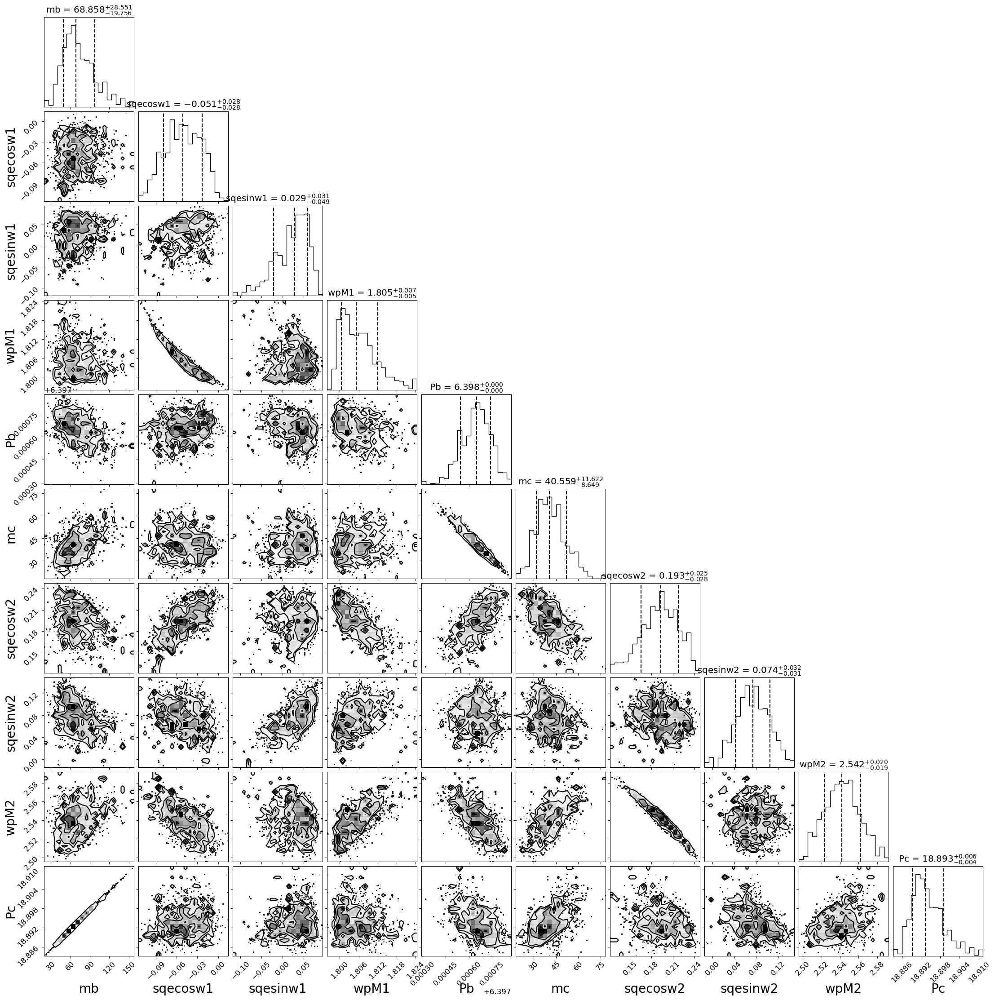

[[822.07193231 822.02013699 824.38958228 ... 820.81357239 814.56810546
  821.89461764]
 [822.07193231 822.02013699 824.38958228 ... 820.81357239 814.56810546
  821.89461764]
 [822.07193231 822.02013699 824.38958228 ... 820.81357239 814.56810546
  821.89461764]
 ...
 [818.40774668 826.71760689 821.76990122 ... 823.24296492 817.64565315
  821.89461764]
 [818.40774668 826.71760689 821.76990122 ... 823.24296492 817.64565315
  821.89461764]
 [818.40774668 826.71760689 821.76990122 ... 823.24296492 817.64565315
  821.89461764]]


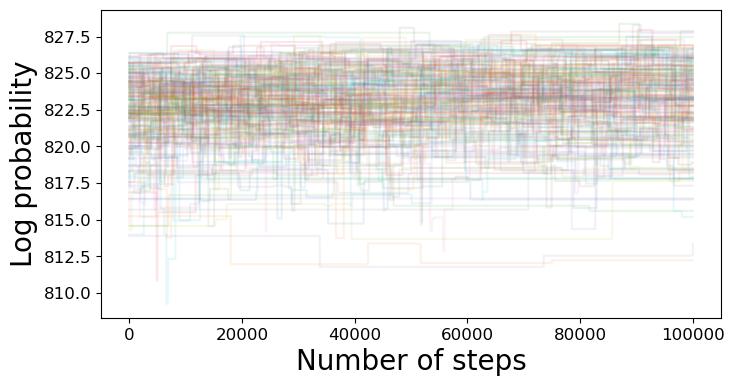

828.3768594506514
[ 6.89599275e+01 -2.29893465e-02  7.87579616e-02  1.80202199e+00
  6.39764406e+00  3.89197327e+01  2.09211448e-01  1.05948351e-01
  2.52538840e+00  1.88934287e+01]


100%|█████████████████████████████████████████| 100000/100000 [2:21:38<00:00, 11.77it/s]


74.4121320952353 + 26.6350037592932 - 19.966109239077596
-0.03948948529024873 + 0.02722148848996466 - 0.032493092129601775
0.050517301039368814 + 0.029206888918297855 - 0.05376834423238129
1.8036610517251588 + 0.006579861238120044 - 0.004289375632994252
6.397634255826675 + 9.265113684620019e-05 - 0.00010458171180971476
41.5209135109585 + 11.837265117788334 - 8.533855687765964
0.19683218846026182 + 0.023111467079305614 - 0.03390532397953244
0.0819649878003598 + 0.03191013455856408 - 0.03312865990473093
2.538756508195973 + 0.022266288777595733 - 0.019221604587031926
18.894393592968544 + 0.005490701456121627 - 0.004119175518098928


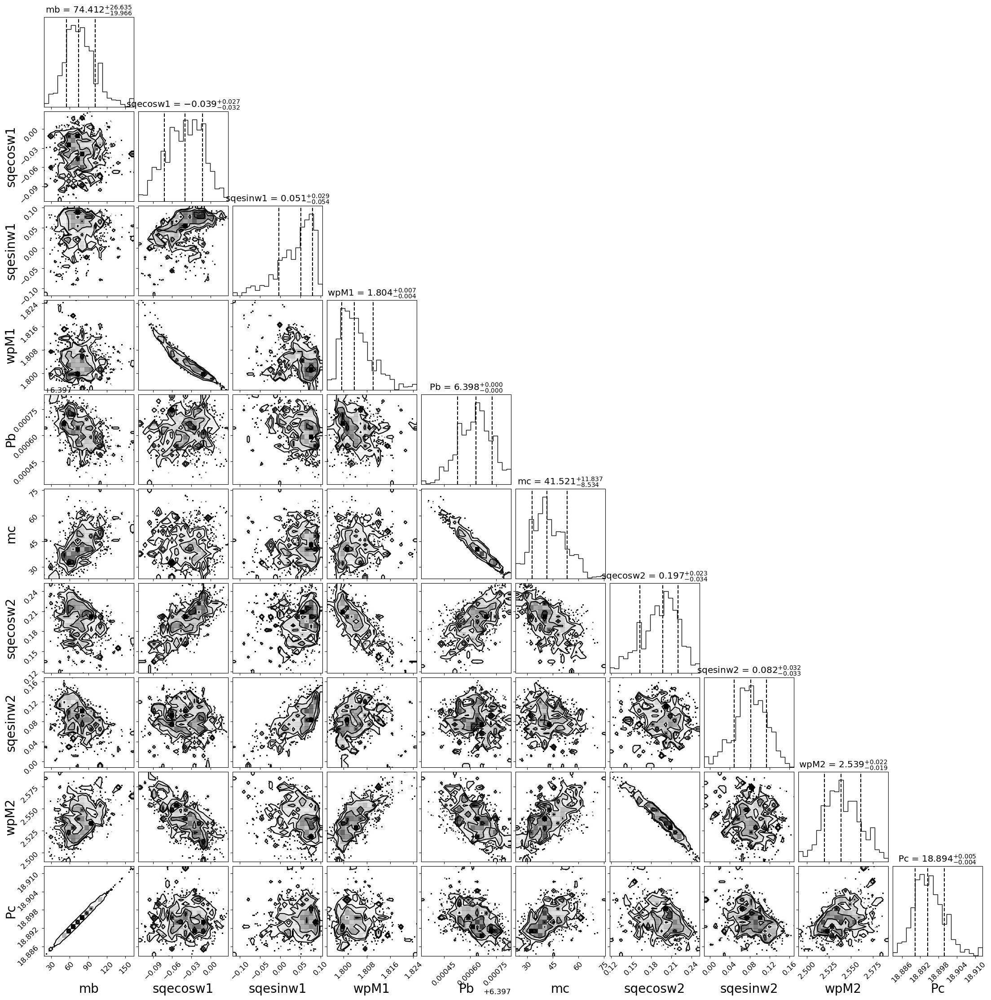

[[818.40774668 826.71760689 821.76990122 ... 823.24296492 817.64565315
  821.89461764]
 [818.40774668 826.71760689 821.76990122 ... 823.24296492 817.64565315
  821.89461764]
 [818.40774668 826.71760689 821.76990122 ... 823.24296492 817.64565315
  821.89461764]
 ...
 [824.50911824 826.72937512 825.48983479 ... 823.4021404  817.62226491
  825.31217391]
 [824.50911824 826.72937512 825.48983479 ... 823.4021404  817.62226491
  825.31217391]
 [824.50911824 826.72937512 825.48983479 ... 823.4021404  817.62226491
  825.31217391]]


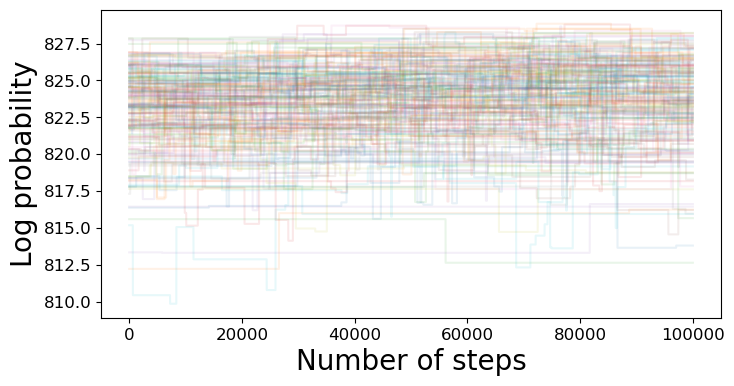

828.8465690815387
[ 5.96347101e+01 -3.25915917e-02  8.90673718e-02  1.80422893e+00
  6.39765315e+00  3.58388558e+01  2.09977149e-01  1.30458099e-01
  2.52010690e+00  1.88916877e+01]


In [7]:
for i in range(2):
    y=mcmc_second(y)
y=mcmc_second_last(y)

100%|█████████████████████████████████████████| 100000/100000 [1:32:37<00:00, 17.99it/s]


77.1349046051889 + 27.828398901891973 - 24.734485052008445
-0.02197370133386726 + 0.034848805502676626 - 0.044749552563781776
0.07806176437177872 + 0.02001029799294625 - 0.04590110206910167
1.8015349773480631 + 0.008039732657837861 - 0.005637964094638015
6.397616583400974 + 9.067405360863035e-05 - 9.540565768961784e-05
41.7932117650781 + 9.383885612201915 - 8.332915754877746
0.2031830209799752 + 0.029418917203083456 - 0.0364273198613376
0.10213272445519815 + 0.028021259232796455 - 0.031125269636360253
2.5303525011081125 + 0.026844632049300543 - 0.02546005853654343
18.895071869553064 + 0.005693837390282397 - 0.00506151686896672


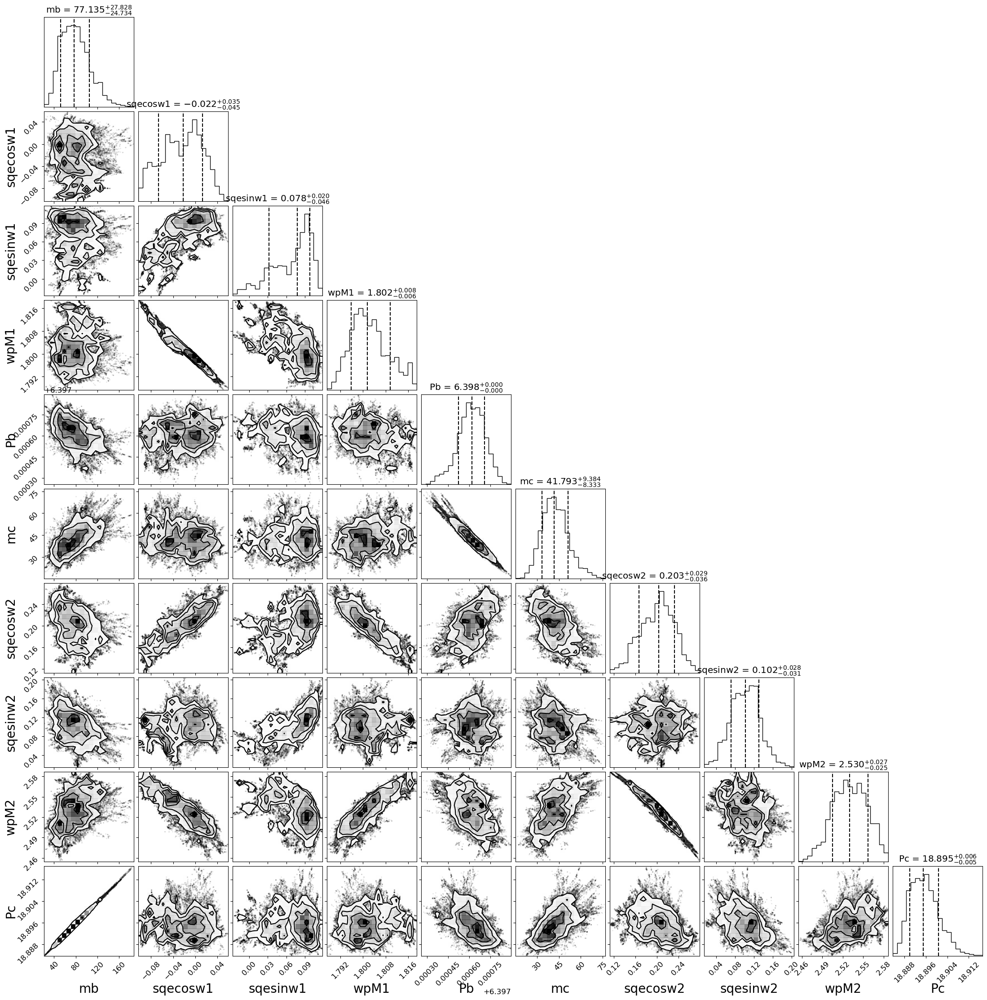

[[823.86884079 823.93828195 823.97111124 ... 828.0349982  828.03537534
  828.20223696]
 [823.86884079 823.93828195 823.97111124 ... 828.0349982  828.03537534
  828.20223696]
 [823.86884079 823.93828195 823.97111124 ... 828.0349982  828.03537534
  828.20223696]
 ...
 [821.83324987 825.1876262  823.43594779 ... 826.26539578 827.57183918
  821.86215434]
 [821.83324987 825.1876262  823.43594779 ... 826.26539578 827.57183918
  821.86215434]
 [821.83324987 825.1876262  823.43594779 ... 826.26539578 827.57183918
  821.86215434]]


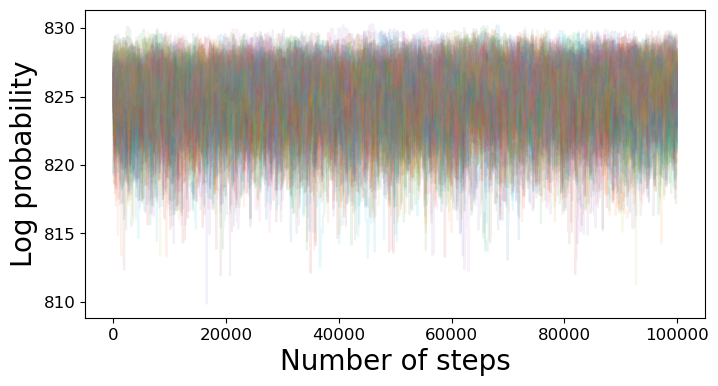

830.1445369696817
[ 7.45384270e+01 -3.79163612e-03  1.04903829e-01  1.79901647e+00
  6.39755705e+00  4.40397031e+01  2.10193664e-01  1.31474565e-01
  2.51939524e+00  1.88948577e+01]


100%|█████████████████████████████████████████| 100000/100000 [1:27:51<00:00, 18.97it/s]


71.73959253100382 + 30.263802498021306 - 22.41370217907067
-0.03224542975273041 + 0.04377452758508982 - 0.037551405081699754
0.07934457827279248 + 0.024418409192342103 - 0.044816813889466504
1.8032994462459297 + 0.007572542861466358 - 0.006989218909607686
6.397599923360439 + 0.00010402931393027615 - 0.00011756546335739415
43.10143490857982 + 11.374632747612416 - 10.224644353211346
0.19257293399191017 + 0.04007649991142023 - 0.03708238113872894
0.10896224162079489 + 0.0434868429626596 - 0.04485083120095608
2.536674194308908 + 0.02495522717252463 - 0.02981013596968074
18.89413984960766 + 0.006049258341139563 - 0.004656428290623182


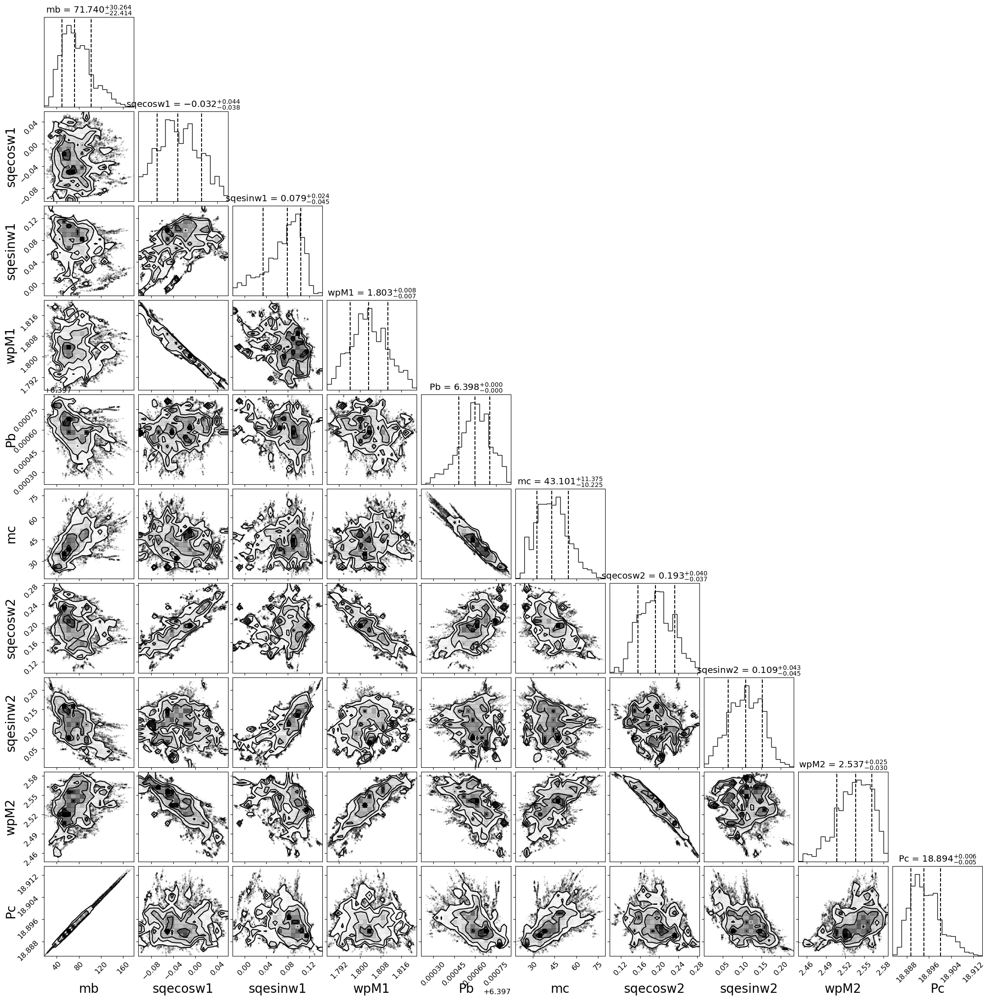

[[821.83324987 825.1876262  823.43594779 ... 826.26539578 827.57183918
  821.86215434]
 [821.83324987 825.1876262  823.43594779 ... 826.26539578 827.57183918
  821.86215434]
 [821.83324987 825.1876262  823.43594779 ... 826.26539578 827.57183918
  821.86215434]
 ...
 [819.6433224  825.22461604 824.45681701 ... 824.02932579 828.2552653
  825.6088383 ]
 [819.6433224  825.22461604 824.45681701 ... 824.02932579 828.2552653
  825.6088383 ]
 [819.6433224  825.22461604 824.45681701 ... 824.02932579 828.2552653
  825.6088383 ]]


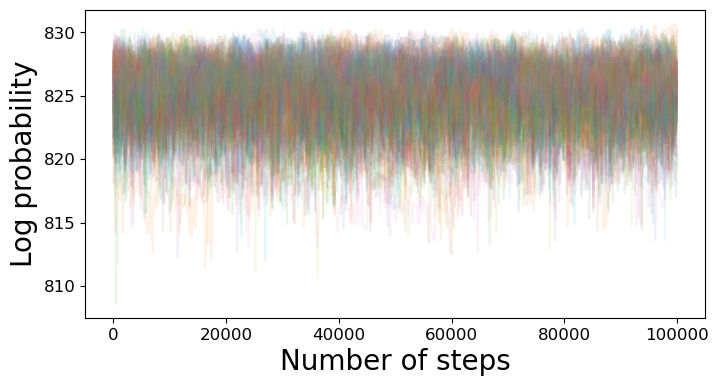

830.6912852364363
[ 6.68658422e+01 -6.33237892e-03  1.16833769e-01  1.79958198e+00
  6.39750344e+00  4.60790219e+01  1.94874276e-01  1.62506302e-01
  2.52533123e+00  1.88934834e+01]


100%|█████████████████████████████████████████| 100000/100000 [1:25:09<00:00, 19.57it/s]


73.49954703664469 + 28.401294559422155 - 25.532530059257653
-0.030632462594625758 + 0.04082348828005561 - 0.036451229272999854
0.08349558962760154 + 0.02166994416299943 - 0.050294325489686646
1.8032348884237925 + 0.008183231173484629 - 0.006663184786714904
6.397589955187426 + 0.0001068501948182643 - 0.00011960348145745314
43.75598528351055 + 10.902159779720442 - 10.199471317892467
0.18706132581154522 + 0.042216347837130686 - 0.03747512291604976
0.11762941238617283 + 0.040082459899548506 - 0.048959580922725995
2.5396544171337556 + 0.024603933382877585 - 0.031180467725490324
18.89444366986624 + 0.005596791882684471 - 0.005195712739315184


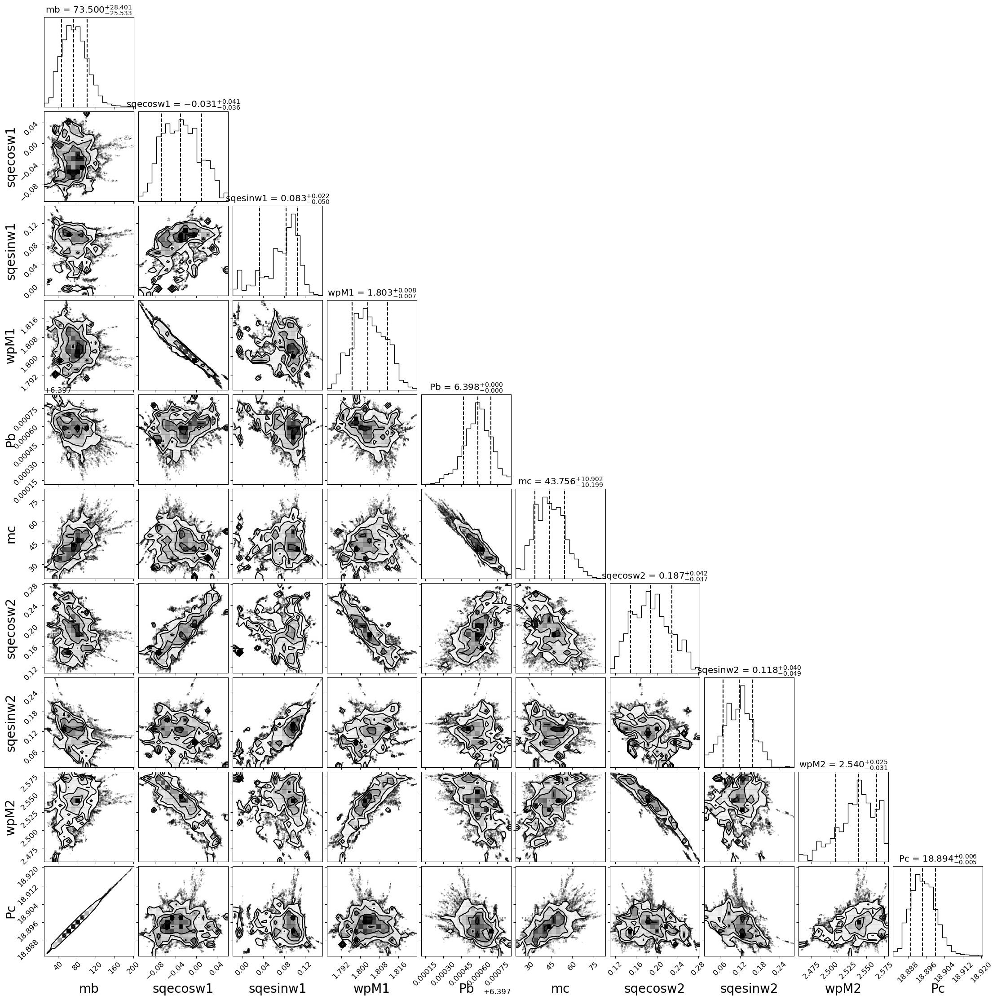

[[819.6433224  825.22461604 824.45681701 ... 824.02932579 828.2552653
  825.6088383 ]
 [819.6433224  825.22461604 824.45681701 ... 824.02932579 828.2552653
  825.6088383 ]
 [819.6433224  825.22461604 824.45681701 ... 824.02932579 828.2552653
  825.6088383 ]
 ...
 [821.7319003  827.87521651 825.2168797  ... 824.4136048  826.10590285
  826.1410003 ]
 [821.7319003  827.87521651 825.2168797  ... 824.4136048  826.10590285
  826.1410003 ]
 [821.7319003  827.87521651 825.2168797  ... 824.4136048  826.10590285
  826.1410003 ]]


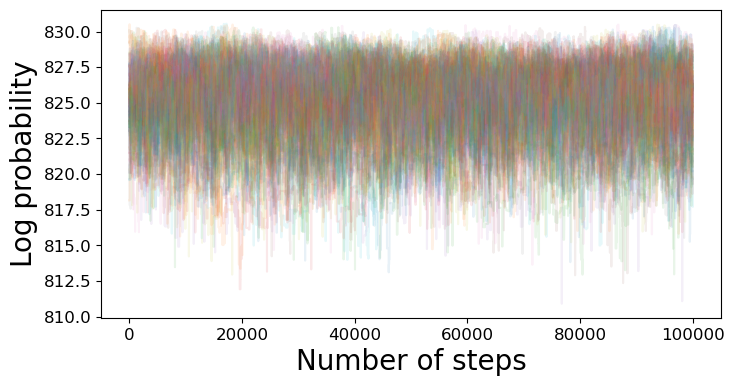

830.489851100255
[ 6.16871670e+01 -5.28930441e-02  1.05315534e-01  1.81040673e+00
  6.39749529e+00  4.62740922e+01  1.46885270e-01  1.75075735e-01
  2.55652030e+00  1.88924997e+01]


100%|█████████████████████████████████████████| 100000/100000 [1:29:32<00:00, 18.61it/s]


67.33537708960466 + 27.607400136436084 - 20.72987117635467
-0.033737543106654236 + 0.044350989294258444 - 0.0349350493170945
0.08726092655880202 + 0.02450442088889475 - 0.04703260726017777
1.8043455389948604 + 0.007393662463140549 - 0.007411880407091287
6.397588186385213 + 0.00012502465839947519 - 0.00014285270650482573
42.920701021825096 + 11.563958943386574 - 10.799940860836998
0.17990518230113534 + 0.04997863517169415 - 0.034442259415155385
0.12497802480865261 + 0.05106501684516895 - 0.054770519883039964
2.5407567602690277 + 0.020538791409715262 - 0.031049917754154333
18.893186503723946 + 0.005458761943682333 - 0.004274497447024572


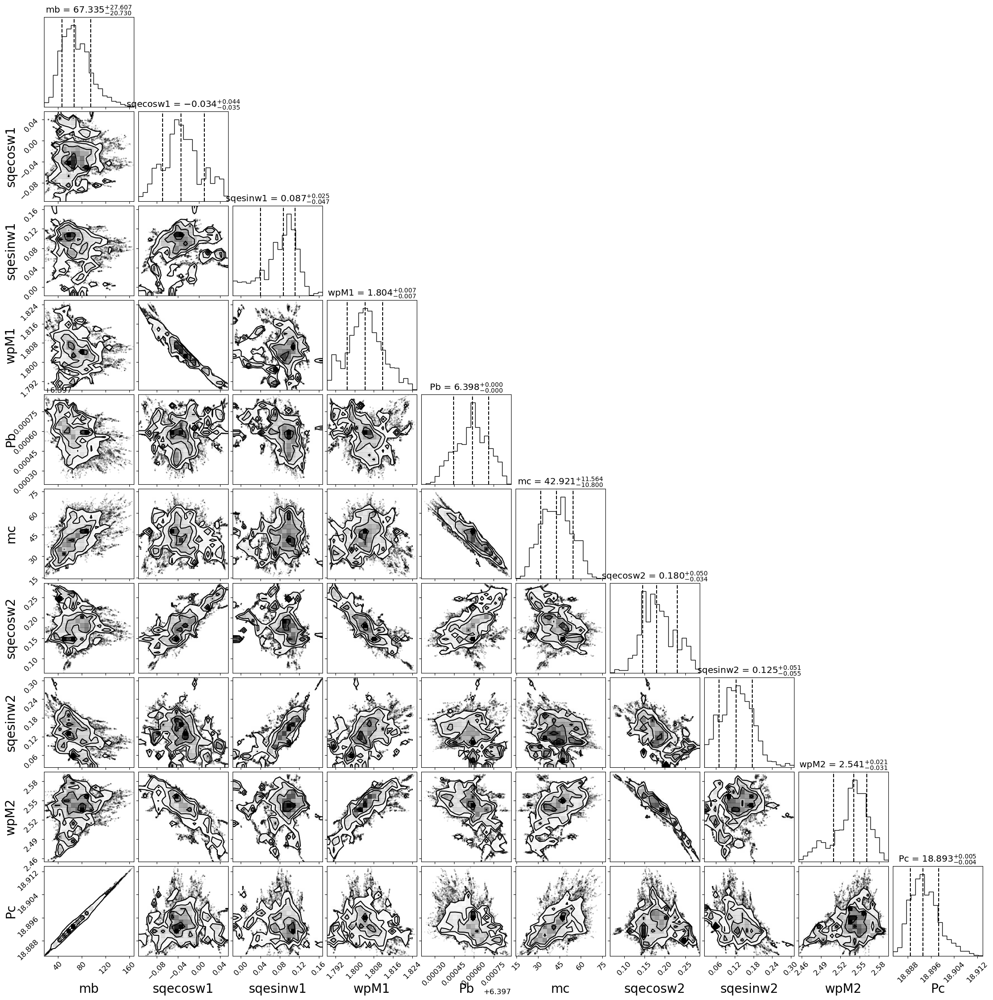

[[821.7319003  827.87521651 825.2168797  ... 824.4136048  826.10590285
  826.1410003 ]
 [821.7319003  827.87521651 825.2168797  ... 824.4136048  826.10590285
  826.1410003 ]
 [821.7319003  827.87521651 825.2168797  ... 824.4136048  826.10590285
  826.1410003 ]
 ...
 [825.70235007 825.95581779 826.11471862 ... 823.44449758 828.45838115
  827.96389253]
 [825.70235007 825.95581779 826.11471862 ... 823.44449758 828.45838115
  827.96389253]
 [825.70235007 825.95581779 826.11471862 ... 823.44449758 828.45838115
  827.96389253]]


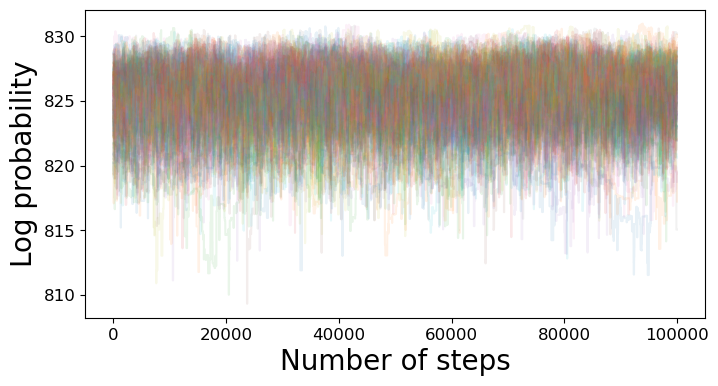

830.9805950612293
[ 5.63997988e+01 -4.17646775e-02  1.25213990e-01  1.80883943e+00
  6.39742073e+00  4.81562011e+01  1.38072499e-01  2.07246415e-01
  2.55521798e+00  1.88916703e+01]


 67%|████████████████████████████▏             | 67181/100000 [1:03:53<34:32, 15.84it/s]

In [ ]:
for i in range(5):
    y=mcmc_third(y)